# <b>Assignment : DT</b>

In [119]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [120]:
!pip install plotly --upgrade

Requirement already up-to-date: plotly in /usr/local/lib/python3.6/dist-packages (4.9.0)


In [121]:
path = '/content/drive/My Drive/AAIC/ASSIGN_11/ASSIGN_11/'

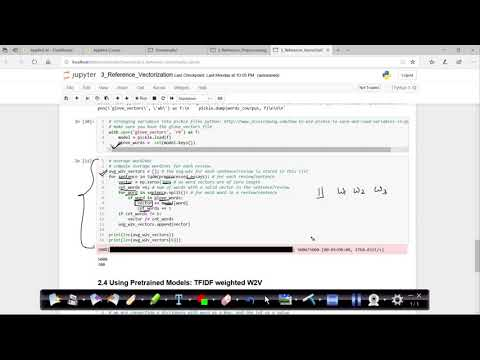

In [122]:
from IPython.display import YouTubeVideo
YouTubeVideo('ZhLXULFjIjQ', width="1000",height="500")

<font color='red'><b> Please check below video before attempting this assignment</b></font>

<font color='red'><b> TF-IDFW2V</b></font>

<b>Tfidf w2v (w1,w2..) = (tfidf(w1) * w2v(w1) + tfidf(w2) * w2v(w2) + …)  /    (tfidf(w1) + tfidf(w2) + …)</b>

<b>(Optional) Please check course video on [AVgw2V and TF-IDFW2V ](https://www.appliedaicourse.com/lecture/11/applied-machine-learning-online-course/2916/avg-word2vec-tf-idf-weighted-word2vec/3/module-3-foundations-of-natural-language-processing-and-machine-learning)for more details.

<font color='blue'><b>Glove vectors </b></font>

<b>In this assignment you will be working with glove vectors , please check  [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) and [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) for more details.</b><br>

Download glove vectors from this [link ](https://drive.google.com/file/d/1lDca_ge-GYO0iQ6_XDLWePQFMdAA2b8f/view?usp=sharing)

In [123]:
#please use below code to load glove vectors 
import pickle
import warnings
warnings.filterwarnings("ignore")
with open(path+'glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

or else , you can use below code

In [124]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

# <font color='red'> <b>Task - 1</b></font>

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  **Note**: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

<font color='blue'><b>Hint for calculating Sentiment scores</b></font>

<h1>1. Decision Tree </h1>

# Task 1

### 1.1 Loading Data

In [125]:
import pandas
data = pandas.read_csv(path+'preprocessed_data.csv',nrows=50000)

In [126]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [127]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import re
from tqdm import tqdm

#### 1.1.0 Adding Sentiment analysis features such as NEG, POS, NEU and COMPOUND polarity scores 

In [128]:
import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()
NEG = []
NEU = []
POS = []
COMP = []
essays = data['essay'].values
for senetence in essays:
  ss = sid.polarity_scores(senetence)
  NEG.append(ss['neg'])
  POS.append(ss['pos'])
  NEU.append(ss['neu'])
  COMP.append(ss['compound'])

df2 = pd.DataFrame({'NEG':NEG,
                    'POS':POS,
                    'NEU':NEU,
                    'COMPOUND':COMP})


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [129]:
df2.head(2)

,NEG,POS,NEU,COMPOUND
0,0.013,0.205,0.783,0.9867
1,0.072,0.248,0.680,0.9897


In [130]:
data = pd.concat([data, df2], axis=1)
data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05,0.013,0.205,0.783,0.9867
1,ut,ms,grades_3_5,4,1,specialneeds,specialneeds,imagine 8 9 years old you third grade classroo...,213.03,0.072,0.248,0.680,0.9897


#### 1.1.1 Processing Project Essay.

In [131]:
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [132]:
#https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [133]:
# Combining all the above stundents 
from tqdm import tqdm
def preprocess_text(text_data):
    preprocessed_text = []
    # tqdm is for printing the status bar
    for sentance in tqdm(text_data):
        sent = decontracted(sentance)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\n', ' ')
        sent = sent.replace('\\"', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
        preprocessed_text.append(sent.lower().strip())
    return preprocessed_text

In [134]:
data.essay.iloc[:1]

0    i fortunate enough use fairy tale stem kits cl...
Name: essay, dtype: object

As there are some stop words present in the text of essay of already preprocessed_data. For example word ` **i** ' is present in the first essay sentence. So, I am processing the essay text again inorder to remove the stop words if there are any by chance and also because  unnecessary stop words increase the dimensionality of the bow/tfidf representation.

In [135]:
data['essay'] = preprocess_text(data['essay'].values)

100%|██████████| 50000/50000 [00:19<00:00, 2504.70it/s]


In [136]:
data.essay.iloc[:1]

0    fortunate enough use fairy tale stem kits clas...
Name: essay, dtype: object

In [137]:
data.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
0,ca,mrs,grades_prek_2,53,1,math_science,appliedsciences health_lifescience,fortunate enough use fairy tale stem kits clas...,725.05,0.013,0.205,0.783,0.9867


#### 1.1.2 Loading data after processing  essay 

In [138]:
Y=data['project_is_approved']       
X=data.drop('project_is_approved',axis=1)

In [139]:
X.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,fortunate enough use fairy tale stem kits clas...,725.05,0.013,0.205,0.783,0.9867


### 1.2 Splitting data into Train and cross validation(or test): Stratified Sampling

In [140]:
from sklearn.model_selection import train_test_split

X_tr,X_te,Y_tr,Y_te = train_test_split(X,Y,test_size=0.33, stratify=Y, random_state=10)

In [141]:
print(X_tr.shape,Y_tr.shape,X_te.shape,Y_te.shape,end=" ")

(33500, 12) (33500,) (16500, 12) (16500,) 

In [142]:
X_train,X_cv,Y_train,Y_cv = train_test_split(X_tr,Y_tr,test_size=0.33, stratify=Y_tr, random_state=10)

In [143]:
print(X_train.shape,Y_train.shape,X_cv.shape,Y_cv.shape,end=" ")

(22445, 12) (22445,) (11055, 12) (11055,) 

### 1.3 Make Data Model Ready: encoding project essay

### 1.3.1 TFIDF Representation of essay.

In [144]:
features_inorder_tfidf = []

In [145]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4))
vectorizer.fit(X_train['essay'].values)

essay_tr_tfidf = vectorizer.transform(X_train['essay'].values)
essay_cv_tfidf = vectorizer.transform(X_cv['essay'].values)
essay_te_tfidf = vectorizer.transform(X_te['essay'].values)


In [146]:
print(essay_tr_tfidf.shape,essay_cv_tfidf.shape,essay_te_tfidf.shape,end=" ")

(22445, 65226) (11055, 65226) (16500, 65226) 

In [147]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))
#print(features_inorder)

65226


### 1.3.2 TFIDF-W2V Representation of essay.

In [148]:
with open(path+'glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [149]:
# average Word2Vec
# compute average word2vec for each review.
def tfidf_w2v_transform(preprocessed_essays):
  tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
  for sentence in tqdm(preprocessed_essays): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors.append(vector)

  return tfidf_w2v_vectors


##### Train data

In [150]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer(min_df=10,ngram_range=(1,4))
tfidf_model.fit(X_train['essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [151]:
essay_tr_tfidf_w2v = np.array(tfidf_w2v_transform(X_train['essay'].values))
essay_cv_tfidf_w2v = np.array(tfidf_w2v_transform(X_cv['essay'].values))
essay_te_tfidf_w2v = np.array(tfidf_w2v_transform(X_te['essay'].values))
#print(preprocessed_essays[:3])

100%|██████████| 16500/16500 [00:32<00:00, 506.35it/s]


In [152]:
print(essay_tr_tfidf_w2v.shape,essay_cv_tfidf_w2v.shape,essay_te_tfidf_w2v.shape,end=" ")

(22445, 300) (11055, 300) (16500, 300) 

<h2>1.4 Make Data Model Ready: encoding numerical, categorical features</h2>

### 1.3.3 Encoding Categorical features
  

In [153]:
data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price', 'NEG',
       'POS', 'NEU', 'COMPOUND'],
      dtype='object')

##### School State

In [154]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values)

state_tr = vectorizer.transform(X_train['school_state'].values)
state_cv = vectorizer.transform(X_cv['school_state'].values)
state_te = vectorizer.transform(X_te['school_state'].values)


In [155]:
print(state_tr.shape,state_cv.shape,state_te.shape,end=" ")

(22445, 51) (11055, 51) (16500, 51) 

In [156]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))
#print(features_inorder)

65277


#### Teacher prefix

In [157]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values)

tchr_prefix_tr = vectorizer.transform(X_train['teacher_prefix'].values)
tchr_prefix_cv = vectorizer.transform(X_cv['teacher_prefix'].values)
tchr_prefix_te = vectorizer.transform(X_te['teacher_prefix'].values)


In [158]:
print(tchr_prefix_tr.shape,tchr_prefix_cv.shape,tchr_prefix_te.shape,end=" ")

(22445, 5) (11055, 5) (16500, 5) 

In [159]:
vectorizer.get_feature_names()

['dr', 'mr', 'mrs', 'ms', 'teacher']

In [160]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))

65282


#### Project grade_category

In [161]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values)

grade_tr = vectorizer.transform(X_train['project_grade_category'].values)
grade_cv = vectorizer.transform(X_cv['project_grade_category'].values)
grade_te = vectorizer.transform(X_te['project_grade_category'].values)


In [162]:
print(grade_tr.shape,grade_cv.shape,grade_te.shape,end=" ")

(22445, 4) (11055, 4) (16500, 4) 

In [163]:
vectorizer.get_feature_names()

['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']

In [164]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))

65286


#### Subject categories

In [165]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values)

subject_tr = vectorizer.transform(X_train['clean_categories'].values)
subject_cv = vectorizer.transform(X_cv['clean_categories'].values)
subject_te = vectorizer.transform(X_te['clean_categories'].values)


In [166]:
print(subject_tr.shape,subject_cv.shape,subject_te.shape,end=" ")

(22445, 9) (11055, 9) (16500, 9) 

In [167]:
vectorizer.get_feature_names()

['appliedlearning',
 'care_hunger',
 'health_sports',
 'history_civics',
 'literacy_language',
 'math_science',
 'music_arts',
 'specialneeds',
 'warmth']

In [168]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))

65295


#### Subject sub categories

In [169]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values)

subj_subct_tr = vectorizer.transform(X_train['clean_subcategories'].values)
subj_subct_cv = vectorizer.transform(X_cv['clean_subcategories'].values)
subj_subct_te = vectorizer.transform(X_te['clean_subcategories'].values)

In [170]:
print(subj_subct_tr.shape,subj_subct_cv.shape,subj_subct_te.shape,end=" ")

(22445, 30) (11055, 30) (16500, 30) 

In [171]:
vectorizer.get_feature_names()

['appliedsciences',
 'care_hunger',
 'charactereducation',
 'civics_government',
 'college_careerprep',
 'communityservice',
 'earlydevelopment',
 'economics',
 'environmentalscience',
 'esl',
 'extracurricular',
 'financialliteracy',
 'foreignlanguages',
 'gym_fitness',
 'health_lifescience',
 'health_wellness',
 'history_geography',
 'literacy',
 'literature_writing',
 'mathematics',
 'music',
 'nutritioneducation',
 'other',
 'parentinvolvement',
 'performingarts',
 'socialsciences',
 'specialneeds',
 'teamsports',
 'visualarts',
 'warmth']

In [172]:
features_inorder_tfidf.extend(list(vectorizer.get_feature_names()))
print(len(features_inorder_tfidf))

65325


From the above codes of subject categories and subject sub categories, we can observe that care_hunger is present in both of the categories. Thus feature indices 10062 and 100611 represent same feature name care_hunger.

### 1.3.4  Encoding Numerical features

#### teacher_number_of_previously_posted_projects

In [173]:
#For z-score normalization the values will be both negative and positive. MultinomialNB does not work with negative values. 
#So we use Min-Max normalization. 
#from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

tchr_prj_tr = scaler.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
tchr_prj_cv = scaler.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
tchr_prj_te = scaler.transform(X_te['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))

In [174]:
print(list(tchr_prj_tr[:5]),'\n',list(tchr_prj_cv[:5]),'\n',list(tchr_prj_te[:5]))

[array([0.00280899]), array([0.]), array([0.04494382]), array([0.08146067]), array([0.01123596])] 
 [array([0.]), array([0.]), array([0.01404494]), array([0.00561798]), array([0.00280899])] 
 [array([0.00842697]), array([0.00561798]), array([0.01966292]), array([0.03651685]), array([0.00280899])]


In [175]:
#from sklearn.preprocessing import MinMaxScaler

#scaler = MinMaxScaler()
#scaler.fit(data['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
#data['teacher_number_of_previously_posted_projects']=scaler.transform(data['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))


In [176]:
features_inorder_tfidf.extend(['teacher_number_of_previously_posted_projects'])
print(len(features_inorder_tfidf))
#print(features_inorder)

65326


#### price

In [177]:
# Min-Max Normalization

scaler = MinMaxScaler()
scaler.fit(X_train['price'].values.reshape(-1, 1))

price_tr = scaler.transform(X_train['price'].values.reshape(-1, 1) )
price_cv = scaler.transform(X_cv['price'].values.reshape(-1, 1) )
price_te = scaler.transform(X_te['price'].values.reshape(-1, 1) )

In [178]:
print(list(price_tr[:5]),'\n',list(price_cv[:5]),'\n',list(price_te[:5]))

[array([0.02487778]), array([0.04781618]), array([0.00340865]), array([0.01502989]), array([0.00585512])] 
 [array([0.00060712]), array([0.00107621]), array([0.03421257]), array([0.00407678]), array([0.02369055])] 
 [array([0.07126968]), array([0.00790852]), array([0.02513283]), array([0.02131009]), array([0.03150205])]


In [179]:
# Min-Max Normalization Use only one Normalization but not both.

#scaler = MinMaxScaler()
#scaler.fit(data['price'].values.reshape(-1, 1))
#data['price']=scaler.transform(data['price'].values.reshape(-1, 1))

In [180]:
features_inorder_tfidf.extend(['price','NEG','POS','NEU','COMPOUND'])
print(len(features_inorder_tfidf))
#print(features_inorder)

65331


### 1.4 Stacking all features to form set1 and set2 features. 

In [181]:
data.columns

Index(['school_state', 'teacher_prefix', 'project_grade_category',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'price', 'NEG',
       'POS', 'NEU', 'COMPOUND'],
      dtype='object')

#### 1.4.1. Set1(TFIDF) features

In [182]:
from scipy.sparse import hstack

X_tr_tfidf = hstack((essay_tr_tfidf, state_tr, tchr_prefix_tr, grade_tr, subject_tr, subj_subct_tr , tchr_prj_tr, price_tr,  np.array(X_train['NEG']).reshape(-1,1), np.array(X_train['POS']).reshape(-1,1), np.array(X_train['NEU']).reshape(-1,1), np.array(X_train['COMPOUND']).reshape(-1,1))).tocsr()
X_cv_tfidf = hstack((essay_cv_tfidf, state_cv, tchr_prefix_cv, grade_cv, subject_cv, subj_subct_cv , tchr_prj_cv, price_cv,  np.array(X_cv['NEG']).reshape(-1,1), np.array(X_cv['POS']).reshape(-1,1), np.array(X_cv['NEU']).reshape(-1,1), np.array(X_cv['COMPOUND']).reshape(-1,1))).tocsr()
X_te_tfidf = hstack((essay_te_tfidf, state_te, tchr_prefix_te, grade_te, subject_te, subj_subct_te , tchr_prj_te, price_te,  np.array(X_te['NEG']).reshape(-1,1), np.array(X_te['POS']).reshape(-1,1), np.array(X_te['NEU']).reshape(-1,1), np.array(X_te['COMPOUND']).reshape(-1,1))).tocsr()

print("Final Data matrix")
print(X_tr_tfidf.shape, Y_train.shape)
print(X_cv_tfidf.shape, Y_cv.shape)
print(X_te_tfidf.shape, Y_te.shape)
print("="*100)

Final Data matrix
(22445, 65331) (22445,)
(11055, 65331) (11055,)
(16500, 65331) (16500,)


In [183]:
print(len(features_inorder_tfidf))

#print(features_inorder)

65331


1. As the Gridserch module available in sklearn implements the inbuilt cross validation, it's better to merge train and cv data.

In [184]:
from scipy.sparse import vstack

X_train_tfidf=vstack((X_tr_tfidf,X_cv_tfidf)).tocsr()
Y_train_tfidf=np.concatenate((Y_train,Y_cv))

In [185]:
print("Final Data matrix")
print(X_train_tfidf.shape, Y_train_tfidf.shape)
print(X_te_tfidf.shape, Y_te.shape)
print("="*100)

Final Data matrix
(33500, 65331) (33500,)
(16500, 65331) (16500,)


#### 1.4.2 Set2(TFIDF-W2V) features


In [186]:
from scipy.sparse import hstack

X_tr_tfidf_w2v = hstack((essay_tr_tfidf_w2v, state_tr, tchr_prefix_tr, grade_tr, subject_tr, subj_subct_tr , tchr_prj_tr, price_tr,  np.array(X_train['NEG']).reshape(-1,1), np.array(X_train['POS']).reshape(-1,1), np.array(X_train['NEU']).reshape(-1,1), np.array(X_train['COMPOUND']).reshape(-1,1))).tocsr()
X_cv_tfidf_w2v = hstack((essay_cv_tfidf_w2v, state_cv, tchr_prefix_cv, grade_cv, subject_cv, subj_subct_cv , tchr_prj_cv, price_cv,  np.array(X_cv['NEG']).reshape(-1,1), np.array(X_cv['POS']).reshape(-1,1), np.array(X_cv['NEU']).reshape(-1,1), np.array(X_cv['COMPOUND']).reshape(-1,1))).tocsr()
X_te_tfidf_w2v = hstack((essay_te_tfidf_w2v, state_te, tchr_prefix_te, grade_te, subject_te, subj_subct_te , tchr_prj_te, price_te,  np.array(X_te['NEG']).reshape(-1,1), np.array(X_te['POS']).reshape(-1,1), np.array(X_te['NEU']).reshape(-1,1), np.array(X_te['COMPOUND']).reshape(-1,1))).tocsr()

print("Final Data matrix")
print(X_tr_tfidf_w2v.shape, Y_train.shape)
print(X_cv_tfidf_w2v.shape, Y_cv.shape)
print(X_te_tfidf_w2v.shape, Y_te.shape)
print("="*100)

Final Data matrix
(22445, 405) (22445,)
(11055, 405) (11055,)
(16500, 405) (16500,)


1. As the Gridserch module available in sklearn implements the inbuilt cross validation, it's better to merge train and cv data.

In [187]:
from scipy.sparse import vstack

X_train_tfidf_w2v=vstack((X_tr_tfidf_w2v,X_cv_tfidf_w2v)).tocsr()
Y_train_tfidf_w2v=np.concatenate((Y_train,Y_cv))

In [188]:
print("Final Data matrix")
print(X_train_tfidf_w2v.shape, Y_train_tfidf_w2v.shape)
print(X_te_tfidf_w2v.shape, Y_te.shape)
print("="*100)

Final Data matrix
(33500, 405) (33500,)
(16500, 405) (16500,)


## 2. Hyper parameter Tuning

### 2.0 functions for plotly plotting

In [216]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np

In [217]:
#https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory/47230966
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

### 2.1 Set1 (TF-IDF) Features

In [219]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

depth = [1,5,10,50]
min_samples = [5, 10, 100, 500]
hyper_param = {'max_depth' : depth, 'min_samples_split' : min_samples }

clf = DecisionTreeClassifier()
classifier = GridSearchCV(clf, hyper_param, cv=5,return_train_score=True, scoring='roc_auc', n_jobs=-1)
classifier.fit(X_train_tfidf, Y_train_tfidf)

results = pd.DataFrame.from_dict(classifier.cv_results_)


In [220]:
results = results.sort_values(['rank_test_score'])
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,12.972162,0.640699,0.025814,0.005383,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.619591,0.621678,0.629241,0.622465,0.633723,0.625340,0.005296,1,0.699552,0.680080,0.668437,0.667593,0.695682,0.682269,0.013342
10,14.331892,0.812178,0.023070,0.000930,10,100,"{'max_depth': 10, 'min_samples_split': 100}",0.624411,0.620264,0.630187,0.616391,0.632125,0.624676,0.005900,2,0.706261,0.687857,0.671322,0.671109,0.701684,0.687647,0.014721


In [221]:
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score'] 
depth =  results['param_max_depth']
min_samples = results['param_min_samples_split']
# we need not generate mesh grid explicitly as depth and min_samples combined together form 2D points for which auc is available.
#print(depth)
#print(min_samples)

In [222]:
enable_plotly_in_cell()

trace1 = go.Scatter3d(x=min_samples,y=depth,z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=min_samples,y=depth,z=cv_auc, name = 'Cross validation')
data_to_plot = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data_to_plot, layout=layout)
fig.show()

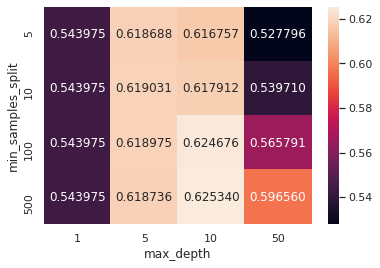

In [223]:
import seaborn as sns
cv_auc_values = pd.DataFrame({'max_depth':depth,
                              'min_samples_split': min_samples,
                              'auc': cv_auc})
cv_auc_values = cv_auc_values.pivot("min_samples_split","max_depth", "auc")
sns.heatmap(cv_auc_values, annot=True, fmt="f")
plt.show()

In [224]:
results = results.sort_values(['rank_test_score'])
best_depth = int(results[results['rank_test_score'] == 1].param_max_depth)
best_min_samples = int(results[results['rank_test_score'] == 1].param_min_samples_split)
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,12.972162,0.640699,0.025814,0.005383,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.619591,0.621678,0.629241,0.622465,0.633723,0.625340,0.005296,1,0.699552,0.680080,0.668437,0.667593,0.695682,0.682269,0.013342
10,14.331892,0.812178,0.023070,0.000930,10,100,"{'max_depth': 10, 'min_samples_split': 100}",0.624411,0.620264,0.630187,0.616391,0.632125,0.624676,0.005900,2,0.706261,0.687857,0.671322,0.671109,0.701684,0.687647,0.014721


In [225]:
print('DT having depth {} and min_samples_split {} gives the best cross-validation auc value'.format(best_depth,best_min_samples))

DT having depth 10 and min_samples_split 500 gives the best cross-validation auc value


From the above plot and table, we can observe that best hyper parameters are max_depth = 10 and min_Samples_split = 500 and we take these values for testing. 

#### 2.1.1 Testing

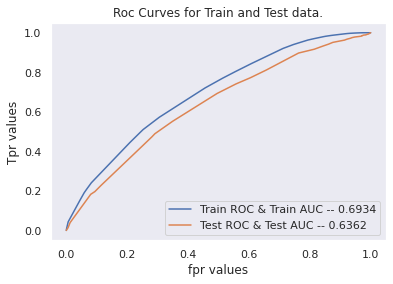

In [226]:
from sklearn.metrics import roc_curve,roc_auc_score,confusion_matrix

clf = DecisionTreeClassifier(max_depth = best_depth, min_samples_split= best_min_samples)
clf.fit(X_train_tfidf,Y_train_tfidf)

y_prob_tr = clf.predict_proba(X_train_tfidf)[:,1]
fpr_tr, tpr_tr, thresholds_tr = roc_curve(Y_train_tfidf,y_prob_tr)
plt.plot(fpr_tr, tpr_tr)

y_prob_te = clf.predict_proba(X_te_tfidf)[:,1]
fpr_te, tpr_te, thresholds_te = roc_curve(Y_te,y_prob_te)
plt.plot(fpr_te, tpr_te)

AUC_tr_tfidf = roc_auc_score(Y_train_tfidf, y_prob_tr)
AUC_te_tfidf = roc_auc_score(Y_te, y_prob_te)

plt.grid()
plt.legend( ('Train ROC & Train AUC -- '+str(np.round(AUC_tr_tfidf, decimals=4)), 'Test ROC & Test AUC -- '+str(np.round(AUC_te_tfidf, decimals=4)) ) )
plt.xlabel('fpr values')
plt.ylabel('Tpr values')
plt.title('Roc Curves for Train and Test data.')
plt.show()


Confusion matrix for the Test data.


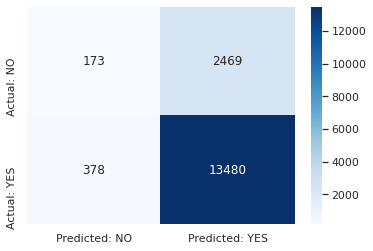

In [227]:
y_pred_tfidf=clf.predict(X_te_tfidf)
cnf_mtrx_tfidf = confusion_matrix(Y_te, y_pred_tfidf)

print('Confusion matrix for the Test data.')
#print(cnf_mtrx_tfidf)
x=pd.DataFrame(cnf_mtrx_tfidf, columns = ["Predicted: NO","Predicted: YES"], index = ["Actual: NO","Actual: YES"] )
sns.heatmap(x, annot=True,fmt="d", cmap='Blues')
plt.show()

In [228]:
sam = pd.DataFrame({'act' : Y_te.values,
                    'pred': y_pred_tfidf},index = Y_te.index)
sam.head()
fp_indices = sam[sam['act']==0][sam['pred']==1].index.values
#fp_indices = fp_indices.reshape(-1,1)
print((fp_indices.shape))

(2469,)


In [229]:
fp_data = X.iloc[fp_indices]  # X is the main date before splitting X into train and test data.
fp_data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
12977,tx,mrs,grades_6_8,2,literacy_language,literature_writing,teach incredible 7th graders low socioeconomic...,86.45,0.062,0.289,0.649,0.9839
35211,sc,mrs,grades_3_5,1,literacy_language music_arts,literature_writing visualarts,school title elementary school population appr...,1464.27,0.017,0.199,0.784,0.9799


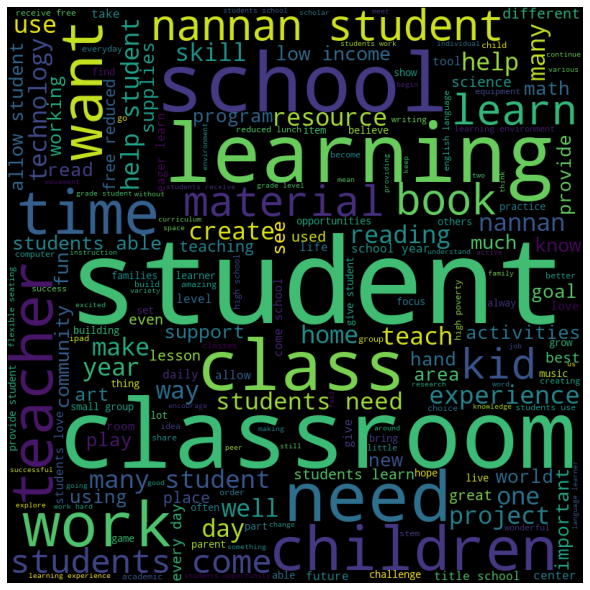

In [230]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

# Reads 'Youtube04-Eminem.csv' file 
df = fp_data.essay.copy()

comment_words = '' 
stopwords = set(STOPWORDS) 
#print(df)
# iterate through the csv file 
for val in df: 
	
	# split the value 
	tokens = val.split() 
	
	comment_words += " ".join(tokens)+" "

cloud = WordCloud(width = 800, height = 800, 
				background_color ='black', 
				stopwords = stopwords, 
				min_font_size = 10).generate(comment_words) 

# plot the WordCloud image					 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

These are the words present in false positive data points of test data. Words of actual disapproved projects but our DT model classifies them as approved projects. Thus we can interpret it as dont get betrayed by looking at these words. Because these words are of actually disapproved projects. 

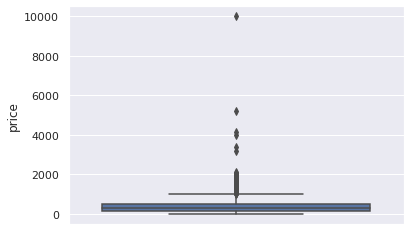

In [231]:
pric = fp_data.price.copy()
sns.boxplot(y=pric)
plt.show()

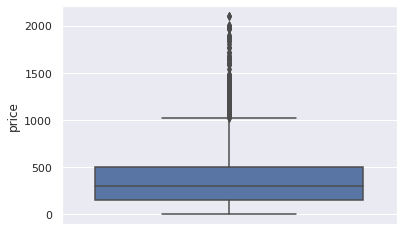

In [233]:
pric = fp_data[fp_data['price']<3000].price.copy()
sns.boxplot(y=pric)
plt.show()

By removing some of the data points having more price, we can observe that 50th percentile of the false positive points is approximately 250 units. We can observe that most of the false positve data points have price < 1000 units.

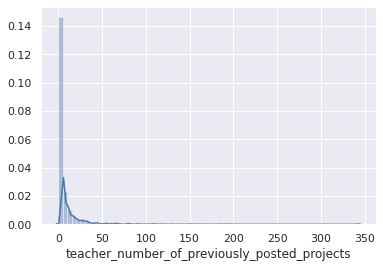

In [234]:
prev_tchr_prj = fp_data.teacher_number_of_previously_posted_projects.copy()
sns.set()

sns.distplot(prev_tchr_prj,bins=np.arange(0,300,5))
plt.show()

For these False positive points, the number of previously posted projects by a teacher less than 5 are very high.

### 2.2 Set2(TF-IDF Weighted W2V) Features

In [235]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

depth = [1,5,10,50]
min_samples = [5, 10, 100, 500]
hyper_param = {'max_depth' : depth, 'min_samples_split' : min_samples }

clf = DecisionTreeClassifier()
classifier = GridSearchCV(clf, hyper_param, cv=5,return_train_score=True, scoring='roc_auc', n_jobs=-1)
classifier.fit(X_train_tfidf_w2v, Y_train_tfidf_w2v)

results = pd.DataFrame.from_dict(classifier.cv_results_)


In [236]:
results = results.sort_values(['rank_test_score'])
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,20.373235,0.449969,0.024808,0.001097,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.623009,0.606026,0.626740,0.622472,0.627095,0.621068,0.007752,1,0.733347,0.716541,0.723564,0.720560,0.721152,0.723033,0.005630
7,10.224600,0.151608,0.023984,0.000648,5,500,"{'max_depth': 5, 'min_samples_split': 500}",0.622314,0.611452,0.625261,0.615803,0.625139,0.619994,0.005479,2,0.666125,0.657245,0.655490,0.658851,0.658022,0.659147,0.003662


In [237]:
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score'] 
depth =  results['param_max_depth']
min_samples = results['param_min_samples_split']
# we need not generate mesh grid explicitly as depth and min_samples combined together form 2D points for which auc is available.
#print(depth)
#print(min_samples)

In [238]:
enable_plotly_in_cell()

trace1 = go.Scatter3d(x=min_samples,y=depth,z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=min_samples,y=depth,z=cv_auc, name = 'Cross validation')
data_to_plot = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data_to_plot, layout=layout)
fig.show()

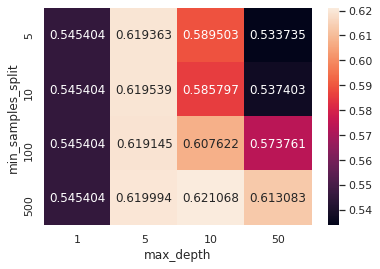

In [239]:
import seaborn as sns
cv_auc_values = pd.DataFrame({'max_depth':depth,
                              'min_samples_split': min_samples,
                              'auc': cv_auc})
cv_auc_values = cv_auc_values.pivot("min_samples_split","max_depth", "auc")
sns.heatmap(cv_auc_values, annot=True, fmt="f")
plt.show()

In [272]:
results = results.sort_values(['rank_test_score'])
best_depth_tfidf_w2v = int(results[results['rank_test_score'] == 1].param_max_depth)
best_min_samples_tfidf_w2v = int(results[results['rank_test_score'] == 1].param_min_samples_split)
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,3.921620,0.141900,0.009953,0.000100,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.622704,0.626559,0.631349,0.635014,0.635989,0.630323,0.005047,1,0.702963,0.687191,0.677032,0.674750,0.693314,0.687050,0.010432
10,4.328289,0.169212,0.010075,0.000131,10,100,"{'max_depth': 10, 'min_samples_split': 100}",0.625302,0.624012,0.632768,0.632786,0.634959,0.629965,0.004426,2,0.712868,0.696329,0.688352,0.679127,0.701089,0.695553,0.011426


In [273]:
print('DT having depth {} and min_samples_split {} gives the best cross-validation auc value'.format(best_depth_tfidf_w2v,best_min_samples_tfidf_w2v))

DT having depth 10 and min_samples_split 500 gives the best cross-validation auc value


From the above plot and table, we can observe that best hyper parameters are max_depth = 10 and min_Samples_split = 500 and we take these values for testing. 

#### 2.1.1 Testing

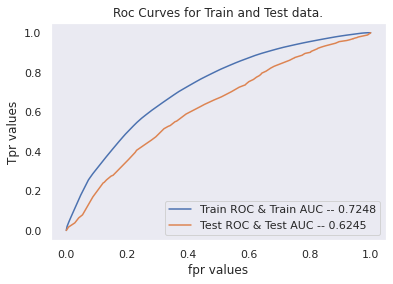

In [274]:
from sklearn.metrics import roc_curve,roc_auc_score,confusion_matrix

clf = DecisionTreeClassifier(max_depth = best_depth_tfidf_w2v, min_samples_split= best_min_samples_tfidf_w2v)
clf.fit(X_train_tfidf_w2v,Y_train_tfidf_w2v)

y_prob_tr = clf.predict_proba(X_train_tfidf_w2v)[:,1]
fpr_tr, tpr_tr, thresholds_tr = roc_curve(Y_train_tfidf_w2v,y_prob_tr)
plt.plot(fpr_tr, tpr_tr)

y_prob_te = clf.predict_proba(X_te_tfidf_w2v)[:,1]
fpr_te, tpr_te, thresholds_te = roc_curve(Y_te,y_prob_te)
plt.plot(fpr_te, tpr_te)

AUC_tr_tfidf_w2v = roc_auc_score(Y_train_tfidf_w2v, y_prob_tr)
AUC_te_tfidf_w2v = roc_auc_score(Y_te, y_prob_te)

plt.grid()
plt.legend( ('Train ROC & Train AUC -- '+str(np.round(AUC_tr_tfidf_w2v, decimals=4)), 'Test ROC & Test AUC -- '+str(np.round(AUC_te_tfidf_w2v, decimals=4)) ) )
plt.xlabel('fpr values')
plt.ylabel('Tpr values')
plt.title('Roc Curves for Train and Test data.')
plt.show()


Confusion matrix for the Test data.


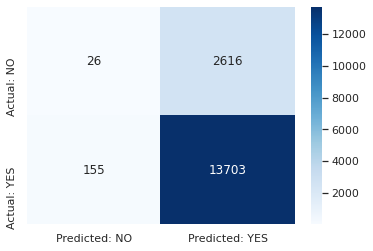

In [275]:
y_pred_tfidf_w2v=clf.predict(X_te_tfidf_w2v)
cnf_mtrx_tfidf_w2v = confusion_matrix(Y_te, y_pred_tfidf_w2v)

print('Confusion matrix for the Test data.')
#print(cnf_mtrx_tfidf)
x=pd.DataFrame(cnf_mtrx_tfidf_w2v, columns = ["Predicted: NO","Predicted: YES"], index = ["Actual: NO","Actual: YES"] )
sns.heatmap(x, annot=True,fmt="d", cmap='Blues')
plt.show()

In [276]:
sam = pd.DataFrame({'act' : Y_te.values,
                    'pred': y_pred_tfidf_w2v},index = Y_te.index)
sam.head()
fp_indices = sam[sam['act']==0][sam['pred']==1].index.values
#fp_indices = fp_indices.reshape(-1,1)
print((fp_indices.shape))

(2616,)


In [277]:
fp_data = X.iloc[fp_indices]
fp_data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
12977,tx,mrs,grades_6_8,2,literacy_language,literature_writing,teach incredible 7th graders low socioeconomic...,86.45,0.062,0.289,0.649,0.9839
35211,sc,mrs,grades_3_5,1,literacy_language music_arts,literature_writing visualarts,school title elementary school population appr...,1464.27,0.017,0.199,0.784,0.9799


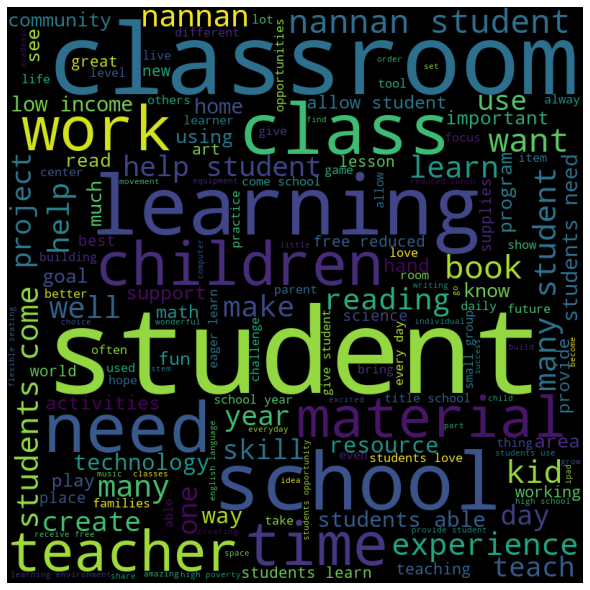

In [278]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

# Reads 'Youtube04-Eminem.csv' file 
df = fp_data.essay.copy()

comment_words = '' 
stopwords = set(STOPWORDS) 
#print(df)
# iterate through the csv file 
for val in df: 
	
	# split the value 
	tokens = val.split() 
	
	comment_words += " ".join(tokens)+" "

cloud = WordCloud(width = 800, height = 800, 
				background_color ='black', 
				stopwords = stopwords, 
				min_font_size = 10).generate(comment_words) 

# plot the WordCloud image					 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

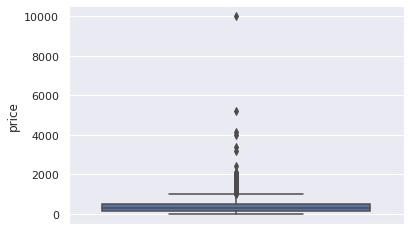

In [279]:
pric = fp_data.price.copy()
sns.boxplot(y=pric)
plt.show()

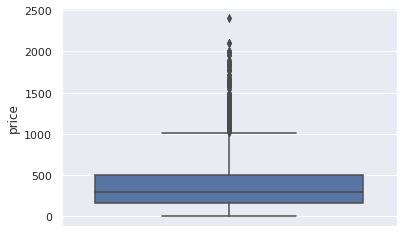

In [280]:
pric = fp_data[fp_data['price']<3000].price.copy()
sns.boxplot(y=pric)
plt.show()

By removing some of the data points having more price, we can observe that 50th percentile of the false positive points is approximately 250 units. We can observe that most of the false positve data points have price < 1000 units.

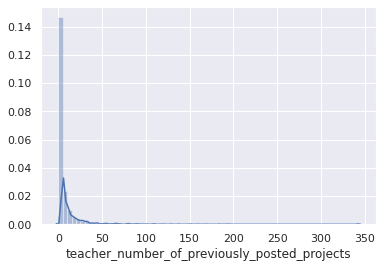

In [281]:
prev_tchr_prj = fp_data.teacher_number_of_previously_posted_projects.copy()
sns.set()

sns.distplot(prev_tchr_prj,bins=np.arange(0,300,5))
plt.show()

For these False positive points, the number of previously posted projects by a teacher less than 5 are very high.

# Task 2

In [282]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train_tfidf, Y_train_tfidf)

ftr_impt = clf.feature_importances_
print(len(ftr_impt))
print(ftr_impt)
non_0_ftr = list(filter(lambda x: ftr_impt[x]>0, range(len(ftr_impt)) ))
X_tr_imp_ftr = X_train_tfidf[:,non_0_ftr]
X_te_imp_ftr = X_te_tfidf[:,non_0_ftr]
print(X_tr_imp_ftr.shape,X_te_imp_ftr.shape)

65331
[0.         0.         0.         ... 0.00369367 0.00493949 0.0026047 ]
(33500, 2193) (16500, 2193)


Hyper parameter tuning for non zero feature importance features using Decision Tree classifier.

In [283]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

depth = [1,5,10,50]
min_samples = [5, 10, 100, 500]
hyper_param = {'max_depth' : depth, 'min_samples_split' : min_samples }

clf = DecisionTreeClassifier()
classifier = GridSearchCV(clf, hyper_param, cv=5,return_train_score=True, scoring='roc_auc', n_jobs=-1)
classifier.fit(X_tr_imp_ftr, Y_train_tfidf)

results = pd.DataFrame.from_dict(classifier.cv_results_)

In [284]:
results = results.sort_values(['rank_test_score'])
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,3.855608,0.160090,0.010044,0.000439,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.621817,0.620336,0.631220,0.637716,0.639056,0.630029,0.007789,1,0.700417,0.683449,0.677810,0.673166,0.692107,0.685390,0.009814
10,4.323032,0.189716,0.013542,0.003641,10,100,"{'max_depth': 10, 'min_samples_split': 100}",0.621834,0.618843,0.633218,0.635144,0.638316,0.629471,0.007691,2,0.709075,0.691131,0.688151,0.677234,0.697598,0.692638,0.010530


In [285]:
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score'] 
depth =  results['param_max_depth']
min_samples = results['param_min_samples_split']

In [286]:
enable_plotly_in_cell()

trace1 = go.Scatter3d(x=min_samples,y=depth,z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=min_samples,y=depth,z=cv_auc, name = 'Cross validation')
data_to_plot = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data_to_plot, layout=layout)
fig.show()

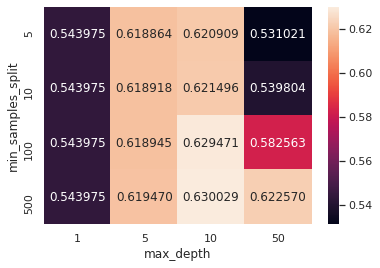

In [287]:
import seaborn as sns
cv_auc_values = pd.DataFrame({'max_depth':depth,
                              'min_samples_split': min_samples,
                              'auc': cv_auc})
cv_auc_values = cv_auc_values.pivot("min_samples_split","max_depth", "auc")
sns.heatmap(cv_auc_values, annot=True, fmt="f")
plt.show()

In [288]:
results = results.sort_values(['rank_test_score'])
best_depth = int(results[results['rank_test_score'] == 1].param_max_depth)
best_min_samples = int(results[results['rank_test_score'] == 1].param_min_samples_split)
results.head(2)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,3.855608,0.160090,0.010044,0.000439,10,500,"{'max_depth': 10, 'min_samples_split': 500}",0.621817,0.620336,0.631220,0.637716,0.639056,0.630029,0.007789,1,0.700417,0.683449,0.677810,0.673166,0.692107,0.685390,0.009814
10,4.323032,0.189716,0.013542,0.003641,10,100,"{'max_depth': 10, 'min_samples_split': 100}",0.621834,0.618843,0.633218,0.635144,0.638316,0.629471,0.007691,2,0.709075,0.691131,0.688151,0.677234,0.697598,0.692638,0.010530


In [289]:
print('DT having depth {} and min_samples_split {} gives the best cross-validation auc value'.format(best_depth,best_min_samples))

DT having depth 10 and min_samples_split 500 gives the best cross-validation auc value


From the above plot and table, we can observe that best hyper parameters are max_depth = 10 and min_Samples_split = 500 and we take these values for testing. 

Testing

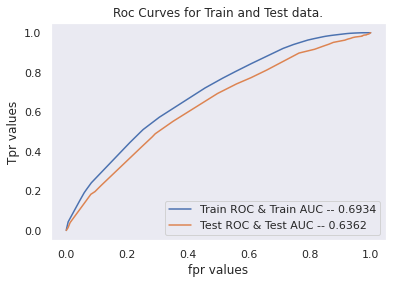

In [290]:
from sklearn.metrics import roc_curve,roc_auc_score,confusion_matrix

clf = DecisionTreeClassifier(max_depth = best_depth, min_samples_split= best_min_samples)
clf.fit(X_tr_imp_ftr,Y_train_tfidf)

y_prob_tr = clf.predict_proba(X_tr_imp_ftr)[:,1]
fpr_tr, tpr_tr, thresholds_tr = roc_curve(Y_train_tfidf,y_prob_tr)
plt.plot(fpr_tr, tpr_tr)

y_prob_te = clf.predict_proba(X_te_imp_ftr)[:,1]
fpr_te, tpr_te, thresholds_te = roc_curve(Y_te,y_prob_te)
plt.plot(fpr_te, tpr_te)

AUC_tr_imp_ftr = roc_auc_score(Y_train_tfidf, y_prob_tr)
AUC_te_imp_ftr = roc_auc_score(Y_te, y_prob_te)

plt.grid()
plt.legend( ('Train ROC & Train AUC -- '+str(np.round(AUC_tr_tfidf, decimals=4)), 'Test ROC & Test AUC -- '+str(np.round(AUC_te_tfidf, decimals=4)) ) )
plt.xlabel('fpr values')
plt.ylabel('Tpr values')
plt.title('Roc Curves for Train and Test data.')
plt.show()


Confusion matrix for the Test data.


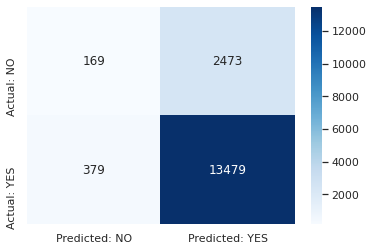

In [291]:
y_pred_imp_ftr = clf.predict(X_te_imp_ftr)
cnf_mtrx_imp_ftr = confusion_matrix(Y_te, y_pred_imp_ftr)

print('Confusion matrix for the Test data.')
#print(cnf_mtrx_tfidf)
x=pd.DataFrame(cnf_mtrx_imp_ftr, columns = ["Predicted: NO","Predicted: YES"], index = ["Actual: NO","Actual: YES"] )
sns.heatmap(x, annot=True,fmt="d", cmap='Blues')
plt.show()

In [292]:

sam = pd.DataFrame({'act' : Y_te.values,
                    'pred': y_pred_imp_ftr},index = Y_te.index)
sam.head()
fp_indices = sam[sam['act']==0][sam['pred']==1].index.values
#fp_indices = fp_indices.reshape(-1,1)
print((fp_indices.shape))

(2473,)


In [293]:
fp_data = X.iloc[fp_indices]
fp_data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,NEG,POS,NEU,COMPOUND
12977,tx,mrs,grades_6_8,2,literacy_language,literature_writing,teach incredible 7th graders low socioeconomic...,86.45,0.062,0.289,0.649,0.9839
35211,sc,mrs,grades_3_5,1,literacy_language music_arts,literature_writing visualarts,school title elementary school population appr...,1464.27,0.017,0.199,0.784,0.9799


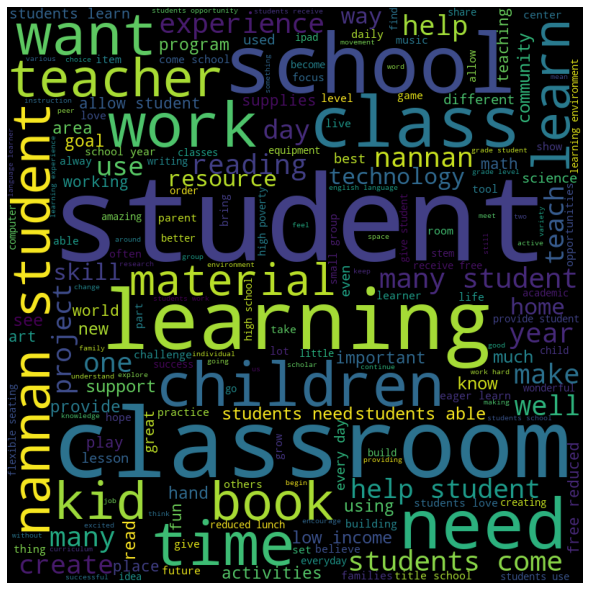

In [294]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 

# Reads 'Youtube04-Eminem.csv' file 
df = fp_data.essay.copy()

comment_words = '' 
stopwords = set(STOPWORDS) 
#print(df)
# iterate through the csv file 
for val in df: 
	
	# split the value 
	tokens = val.split() 
	
	comment_words += " ".join(tokens)+" "

cloud = WordCloud(width = 800, height = 800, 
				background_color ='black', 
				stopwords = stopwords, 
				min_font_size = 10).generate(comment_words) 

# plot the WordCloud image					 
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

plt.show() 

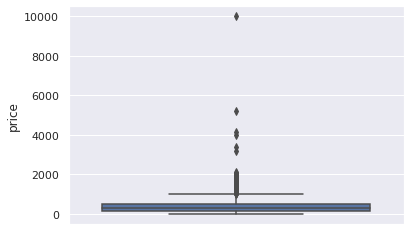

In [295]:
pric = fp_data.price.copy()
sns.boxplot(y=pric)
plt.show()

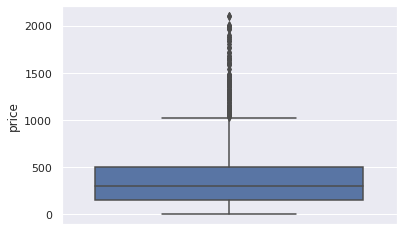

In [296]:
pric = fp_data[fp_data['price']<3000].price.copy()
sns.boxplot(y=pric)
plt.show()

By removing some of the data points having more price, we can observe that 50th percentile of the false positive points is approximately 250 units.

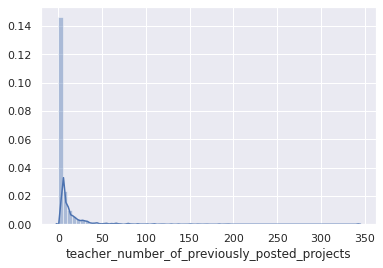

In [297]:
prev_tchr_prj = fp_data.teacher_number_of_previously_posted_projects.copy()
sns.set()

sns.distplot(prev_tchr_prj,bins=np.arange(0,300,5))
plt.show()

For these False positive points, the number of previously posted projects by a teacher less than 5 are very high.

Observations from Task1 and Task2:
1. Results on task1 and task2 are almost similar.
2. Results on DT classifier by taking all features is almost same as results on the same DT classfier taking only the important features(features having non zero feature importance.)
3. AUC values are same for both Task1 and Task2.

# 3. Summary

In [301]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable

x = PrettyTable()
x.field_names = ["Vectorizer","Model", "Hyper parameters (depth and min_samples split)", "Train AUC", "Test AUC"]

for i in range(1):
    x.add_row(['TFIDF', "Decision Tree", (best_depth,best_min_samples) , np.round(AUC_tr_tfidf,4), np.round(AUC_te_tfidf,4) ])
    x.add_row(["TFIDF-W2V", "Decision Tree" , (best_depth_tfidf_w2v,best_min_samples_tfidf_w2v) , np.round(AUC_tr_tfidf_w2v,4) , np.round(AUC_te_tfidf_w2v,4) ])
print(x)

+------------+---------------+------------------------------------------------+-----------+----------+
| Vectorizer |     Model     | Hyper parameters (depth and min_samples split) | Train AUC | Test AUC |
+------------+---------------+------------------------------------------------+-----------+----------+
|   TFIDF    | Decision Tree |                   (10, 500)                    |   0.6934  |  0.6362  |
| TFIDF-W2V  | Decision Tree |                   (10, 500)                    |   0.7248  |  0.6245  |
+------------+---------------+------------------------------------------------+-----------+----------+
